# Introduction
Employees are the backbone of any organization. The success of an organization is heavily dependent on committed employees who are motivated and productive to carry out a company's goals and objectives.

Thus, employee attrition, the rate at which employees leave their job, hurts the growth and performance of an organization in terms of financial profit, productivity, and time. However, attrition is an inevitable part of any business. There will come a time when an employees wants to leave a company, which can happen for many reasons. For instance, employees might be seeking for better opportunities, mentally illed, working excessive hours, working in a toxic atmosphere or under bad management, etc. But when attrition reaches a particular threshold, it becomes a concern to be addressed as it may be reflecting a deep problem with the company culture. Attrition is particularly concerning when the attrition rate is high, indicating that employees are turning over pretty quickly, or when early attrition rate is high, indicating new joiners leave the company within the first few years of employment. Therefore, it is important to ask questions, find out why people are leaving, and understand what is influencing attrition rate within an organization.

The most important question to ask is what factors are contributing to more employee attrition? Thus, by understanding these reasons for employee attrition, a company can take the correct measures to retain their employees.

To explore these correlations, we used an IBM Employee Attrition dataset to explore and visualize interesting and significant factors that lead to higher employee attrition.

For this project, we have used an IBM employee data set hosted on Kaggle that contains various personal and professional information about an employee (i.e. Attrition, Age, Monthly Income, etc). The dataset was last updated in 2017 and does not have any missing data, which makes it easier to work with.

In total, there are 1470 observations (rows) and each observation represents an employee. There are 35 variables (columns) and below are the variables contained in the dataset:

Age: Employee age
Attrition: if the employee leaves the job
BusinessTravel: The frequency of job travels
DailyRate: Billing cost for employee's services for a single day
Department: Employee work department
DistanceFromHome: Distance traveled to work from home
Education: Employee education level (1 = Below College, 2 = College, 3 = Bachelor, 4 = Master, 5 = Doctor)
EducationField: Employee education field
EmployeeCount: Employee Count (Constant)
EmployeeNumber: Employee ID
EnvironmentSatisfaction: Numerical value for environment satisfaction (1 = Low, 2 = Medium, 3 = High, 4 = Very High)
Gender: Employee gender
HourlyRate: The amount of money that employee earns for every hour worked
JobInvolvement: Numerical value for job involvement (1 = Low, 2 = Medium, 3 = High, 4 = Very High)
JobLevel: Numerical value for job level
JobRole: Employee job position
JobSatisfaction: Numerical value for job satisfaction (1 = Low, 2 = Medium, 3 = High, 4 = Very High)
MaritalStatus: Employee marital status
MonthlyIncome: The amount of money that employee earns in one month, before taxes or deductions
MonthlyRate: Billing cost for employee's services for a month
NumCompaniesWorked: Number of companies worked at
Over18: if employee is over 18 years old
OverTime: if employee works overtime
PercentSalaryHike: Percent increase in salary
PerformanceRating: Numerical value for performance rating (1 = Low, 2 = Good, 3 = Excellent, 4 = Outstanding)
RelationshipSatisfaction: Numerical value for relationship satisfaction (1 = Low, 2 = Medium, 3 = High, 4 = Very High)
StandardHours: Hours employee spent working (Constant)
StockOptionsLevel: Numerical value for stock options
TotalWorkingYears: Total number of years employee worked
TrainingTimesLastYear: Hours employee spent on training last year
WorkLifeBalance: Numerical value for work life balance (1 = Bad, 2 = Good, 3 = Better, 4 = Best)
YearsAtCompany: Number of years employee worked at company
YearsInCurrentRole: Number of years employee worked as their current job role
YearsSinceLastPromotion: Number of years since last promotion
YearsWithCurrentManager: Number of years employee worked with current manager

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Let's load our dataset now:
df=pd.read_csv("HR-Employee-attrition.csv")

In [3]:
df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


Before we look at multivariate relationships, we need to apply Exploratory Data Analysis (EDA) on the dataset to help us find interesting relations between the variables. The primary goal of EDA is maximize the insight into the data set and into its underlying structure, while extracting important specifics from the data set, By investigating the data set and summarizing its main characteristics, we can spot anomalies and outliers to formalize our research questions.

In [4]:
df.shape

(1470, 35)

In [5]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [8]:
df.describe(include='O').columns.tolist()

['Attrition',
 'BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime']

In [9]:
df[df.duplicated(keep=False)]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


i.e- data has no duplicate row

# Now let's visualise our data and look for insights.

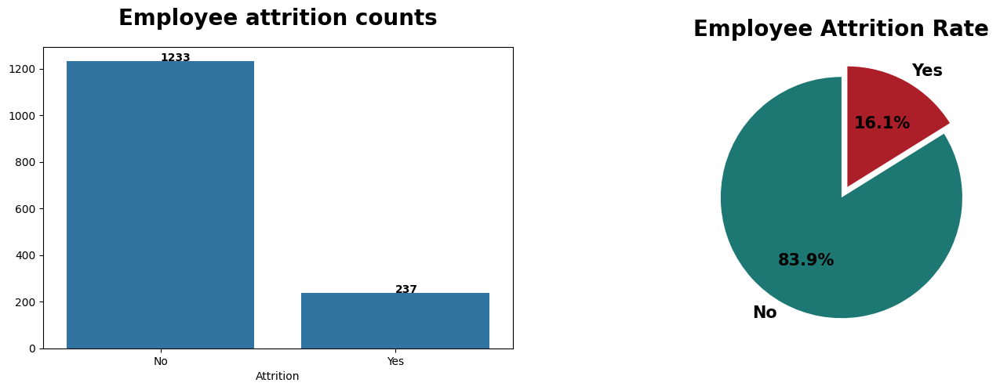

In [10]:
#visualising attriction feature
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
attrition=df['Attrition'].value_counts()
sns.barplot(x=attrition.index,y=attrition.values)
plt.title("Employee attrition counts",fontweight="black",pad=20,size=20)

for i,v in enumerate(attrition.values):
    plt.text(i,v,str(v),fontweight="black")

plt.subplot(1,2,2)
plt.pie(attrition,labels=['No','Yes'],autopct="%.1f%%",textprops={"fontweight":"black","size":15},colors = ["#1d7874","#AC1F29"],explode=[0,0.1],startangle=90)
plt.title("Employee Attrition Rate",fontweight="black",size=20,pad=10)
plt.show()

This represents the undersampling in category 'yes'.

**Now, we will analyse Attrition Rate with respect to different columns in our dataset.**

In [11]:
attrition_rate=df['Attrition'].value_counts()

In [12]:
attrition_rate

Attrition
No     1233
Yes     237
Name: count, dtype: int64

In [13]:
attrition_rate.values

array([1233,  237])

In [14]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [15]:
classesinBT=df['BusinessTravel'].drop_duplicates().tolist()
classesinBT

['Travel_Rarely', 'Travel_Frequently', 'Non-Travel']

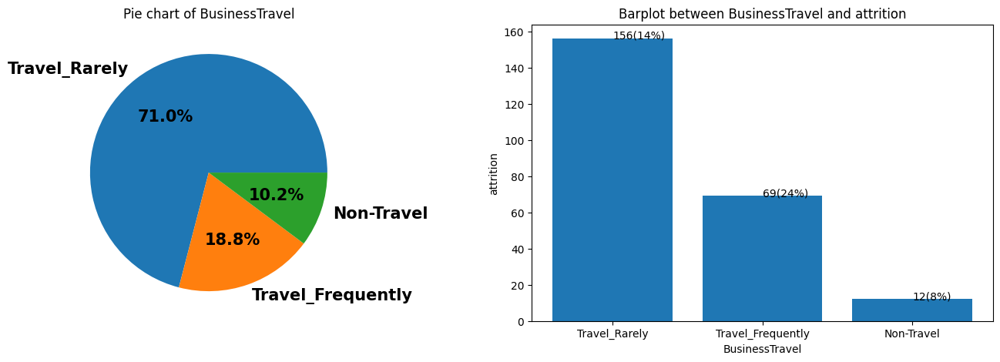

In [16]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['BusinessTravel'].value_counts()
plt.pie(val1,autopct='%.1f%%',labels=classesinBT,textprops={"fontweight":"black","size":15})
plt.title("Pie chart of BusinessTravel")

val2=df[df['Attrition']=='Yes']['BusinessTravel'].value_counts()
attrition_rate=np.floor(val2/val1 *100).values
plt.subplot(1,2,2)
plt.bar(val1.index,height=val2.values)
plt.title("Barplot between BusinessTravel and attrition")
plt.xlabel("BusinessTravel")
plt.ylabel("attrition")

for i,v in enumerate(val2):
    plt.text(i,v,str(v)+"("+str(int(attrition_rate[i]))+"%)")
#plt.bar(BusinessTravel.index,height=

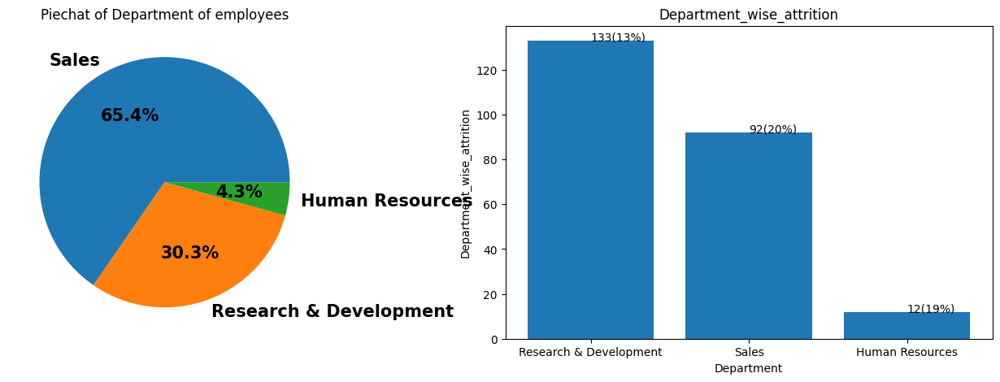

In [17]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
Department=df['Department'].value_counts()
plt.pie(Department,autopct="%.1f%%",labels=df['Department'].drop_duplicates().tolist(),textprops={'fontweight':'black','size':15})
plt.title('Piechat of Department of employees')

plt.subplot(1,2,2)
Department_wise_attrition=df[df['Attrition']=='Yes']['Department'].value_counts()
attrition_rate=np.floor((Department_wise_attrition/Department)*100).values
plt.bar(Department_wise_attrition.index,height=Department_wise_attrition.values)
plt.xlabel('Department')
plt.ylabel('Department_wise_attrition')
plt.title('Department_wise_attrition')
for i,v in enumerate(Department_wise_attrition):
    plt.text(i,v,str(v)+"("+str(int(attrition_rate[i]))+"%)")

In [18]:
categorical_features=df.drop('Attrition',axis=1).describe(include='O').columns.tolist()
categorical_features

['BusinessTravel',
 'Department',
 'EducationField',
 'Gender',
 'JobRole',
 'MaritalStatus',
 'Over18',
 'OverTime']

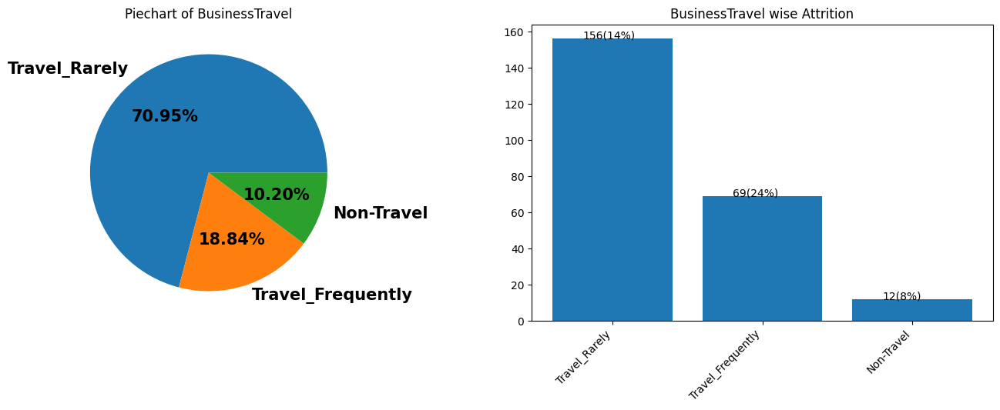

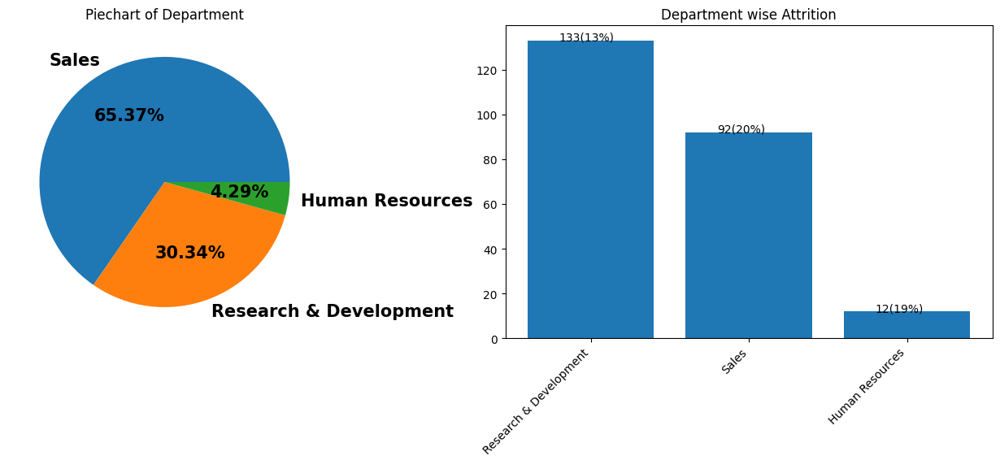

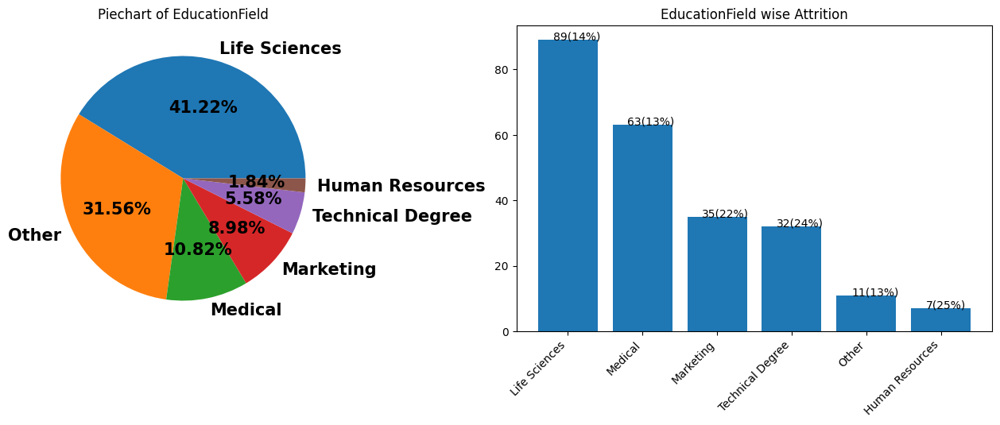

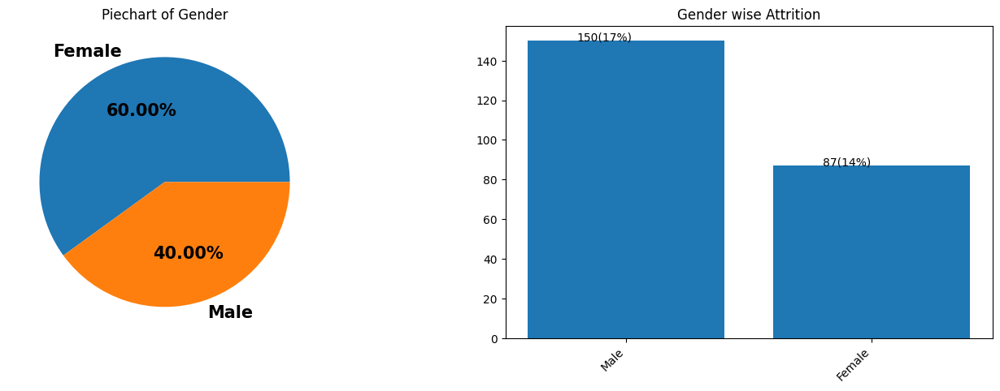

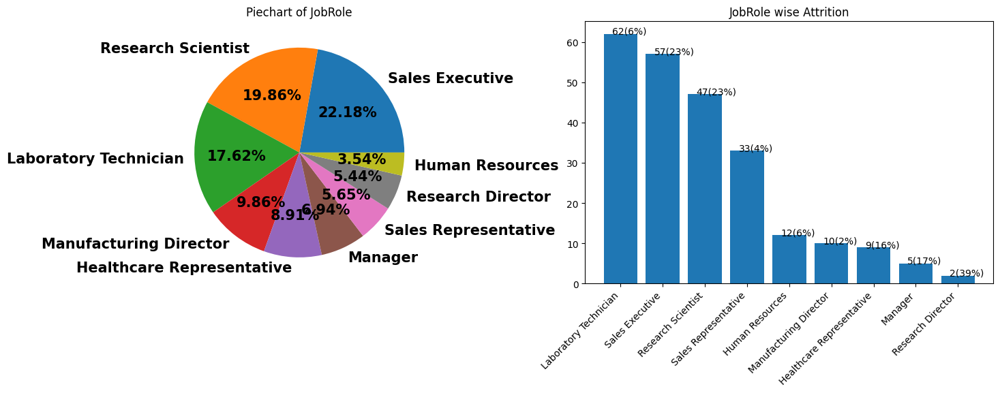

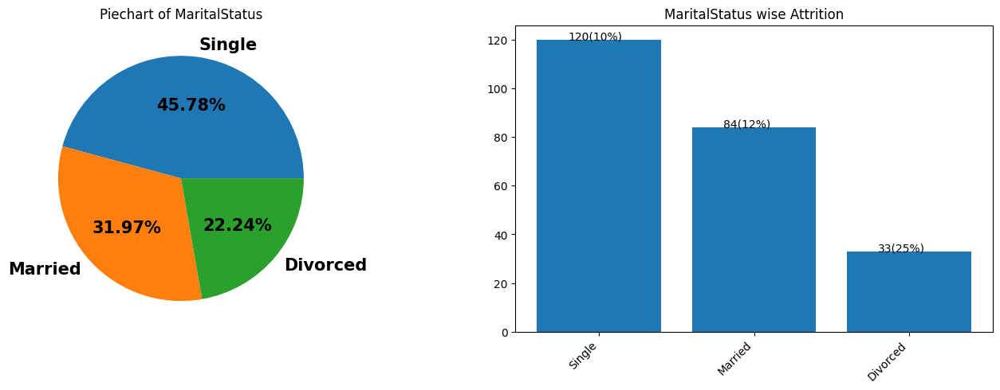

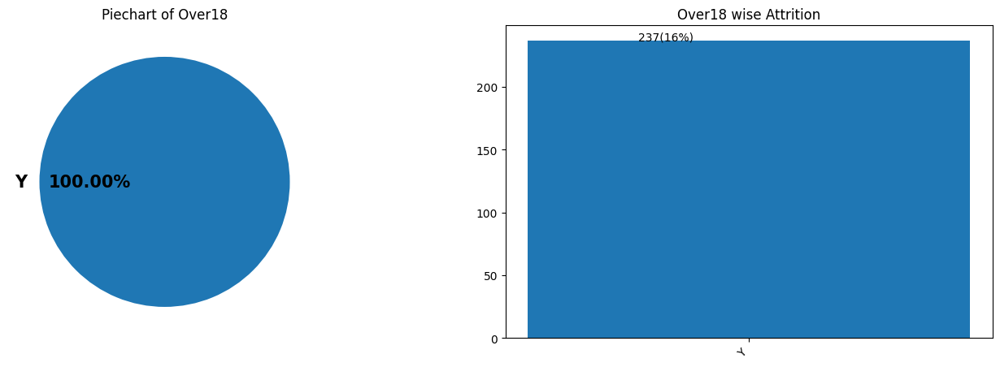

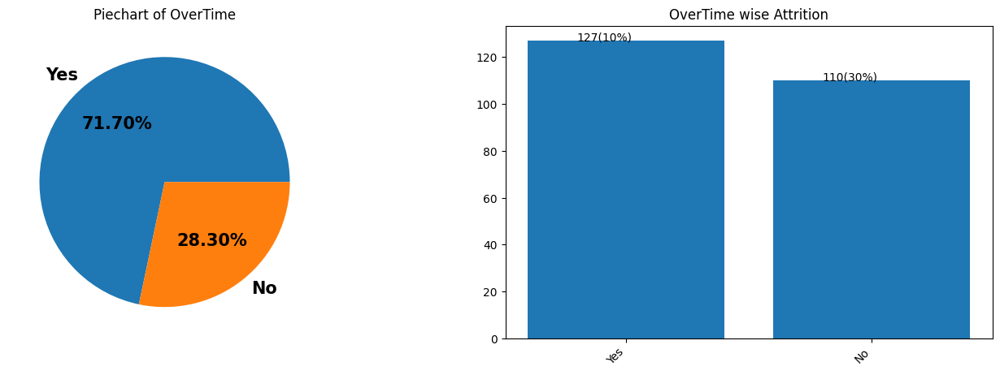

In [19]:
for feature in categorical_features:
    plt.figure(figsize=(17,5))
    plt.subplot(1,2,1)
    feature_val=df[feature].value_counts()
    plt.pie(feature_val,labels=df[feature].drop_duplicates().tolist(),autopct='%.2f%%',textprops={'fontweight':'black','size':15})
    plt.title('Piechart of '+feature)

    plt.subplot(1,2,2)
    feature_valY=df[df['Attrition']=='Yes'][feature].value_counts()
    attrition_rate=np.floor((feature_valY/feature_val)*100).values
    plt.bar(feature_valY.index,height=feature_valY.values)
    for i,v in enumerate(feature_valY):
        plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
    plt.title(feature+' wise Attrition')
    plt.xticks(rotation=45, ha='right')
    plt.show()

In [20]:
#since feature 'Over18' is constant so can can drop it.
df=df.drop('Over18',axis=1)

In [21]:
df.shape

(1470, 34)

In [22]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCom

In [23]:
#since EmployeeCount feature is constant ,so we can drop it
df=df.drop('EmployeeCount',axis=1)

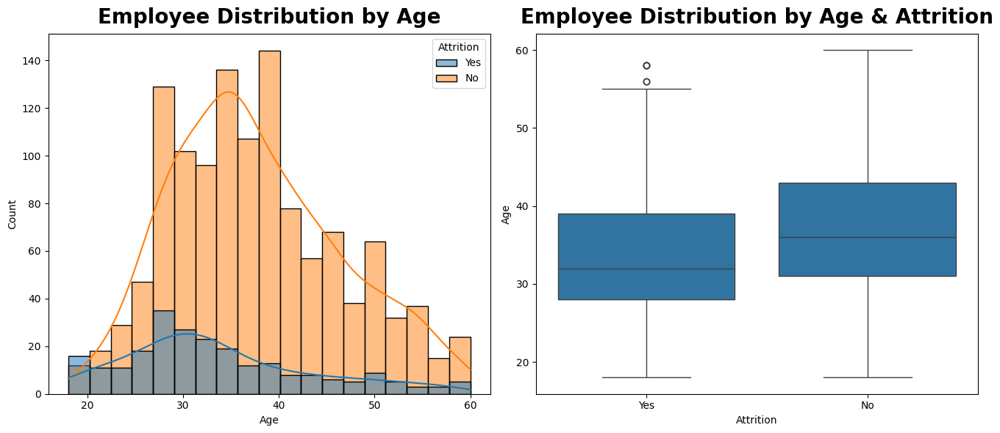

In [24]:
#Visualization to show Employee Distribution by Age.
plt.figure(figsize=(13.5,6))
plt.subplot(1,2,1)
sns.histplot(x="Age",hue="Attrition",data=df,kde=True)
plt.title("Employee Distribution by Age",fontweight="black",size=20,pad=10)


#Visualization to show Employee Distribution by Age & Attrition.
plt.subplot(1,2,2)
sns.boxplot(x="Attrition",y="Age",data=df)
plt.title("Employee Distribution by Age & Attrition",fontweight="black",size=20,pad=10)
plt.tight_layout()
plt.show()


0
1
2
3


Text(0.5, 1.0, 'EnvironmentSatifaction wise attrition')

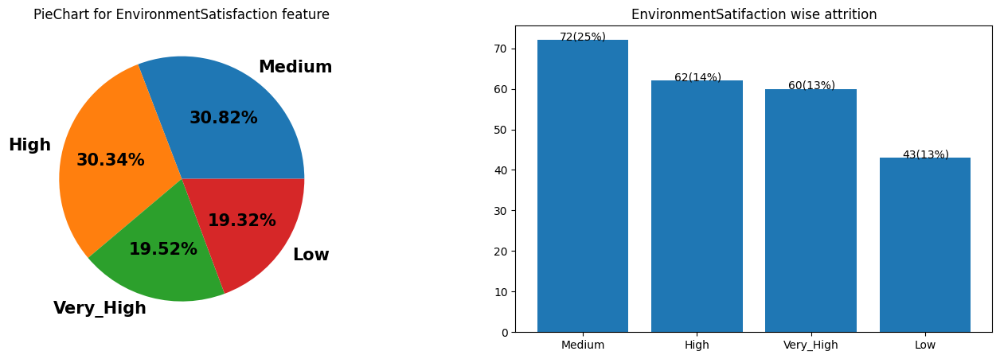

In [25]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['EnvironmentSatisfaction'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=['Medium','High','Very_High','Low'],textprops={'fontweight':'black','size':15})
plt.title('PieChart for EnvironmentSatisfaction feature')

plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['EnvironmentSatisfaction'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(['Medium','High','Very_High','Low'],height=val2.values)
for i,v in enumerate(val2):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
    print(i)
plt.title('EnvironmentSatifaction wise attrition')

In [26]:
#JobInvolvement
df['JobInvolvement'].drop_duplicates().tolist()

[3, 2, 4, 1]

Text(0.5, 1.0, 'JobInvolvement wise attrition')

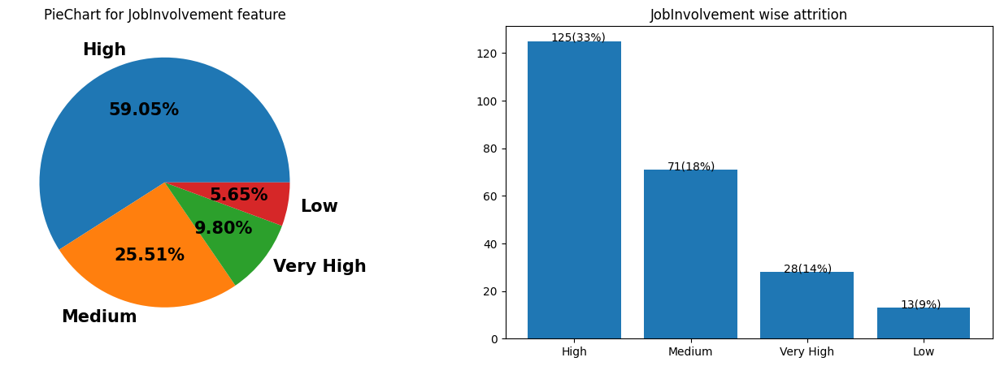

In [27]:
categories=['High','Medium','Very High','Low']
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['JobInvolvement'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=categories,textprops={'fontweight':'black','size':15})
plt.title('PieChart for JobInvolvement feature')


plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['JobInvolvement'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(categories,val2.values)
for i, v in enumerate(val2):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('JobInvolvement wise attrition')

In [28]:
df['JobLevel'].nunique()

5

Text(0.5, 1.0, 'JobLevel wise attrition')

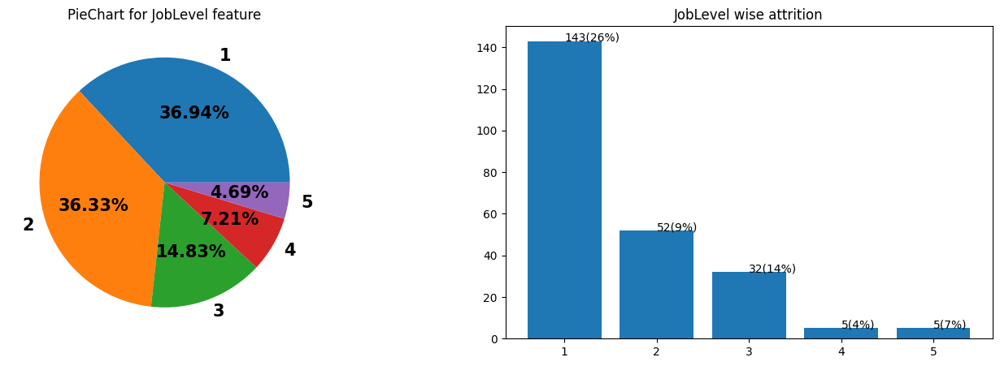

In [29]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['JobLevel'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=[1,2,3,4,5],textprops={'fontweight':'black','size':15})
plt.title('PieChart for JobLevel feature')
plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['JobLevel'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(val2.index,val2.values)
for i, v in enumerate(val2):
    plt.text(i+1,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('JobLevel wise attrition')

In [30]:
df['JobSatisfaction'].drop_duplicates().tolist()

[4, 2, 3, 1]

Text(0.5, 1.0, 'JobSatisfaction wise attrition')

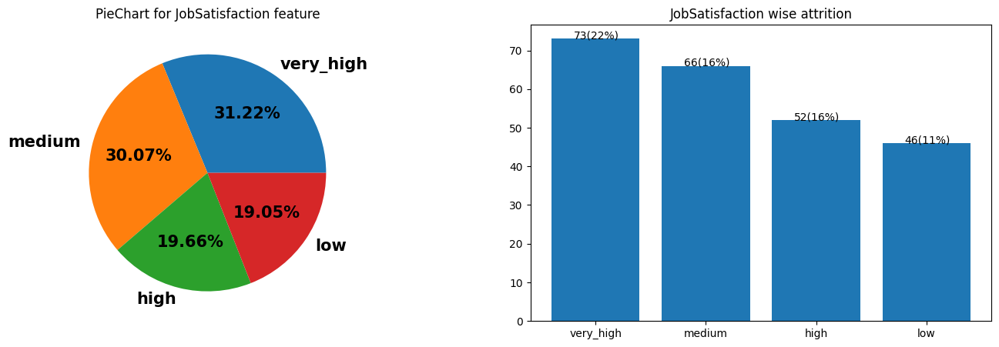

In [31]:
categories=['very_high','medium','high','low']
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['JobSatisfaction'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=categories,textprops={'fontweight':'black','size':15})
plt.title('PieChart for JobSatisfaction feature')
plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['JobSatisfaction'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(categories,val2.values)
for i, v in enumerate(val2):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('JobSatisfaction wise attrition')

In [32]:
df['PercentSalaryHike'].describe()

count    1470.000000
mean       15.209524
std         3.659938
min        11.000000
25%        12.000000
50%        14.000000
75%        18.000000
max        25.000000
Name: PercentSalaryHike, dtype: float64

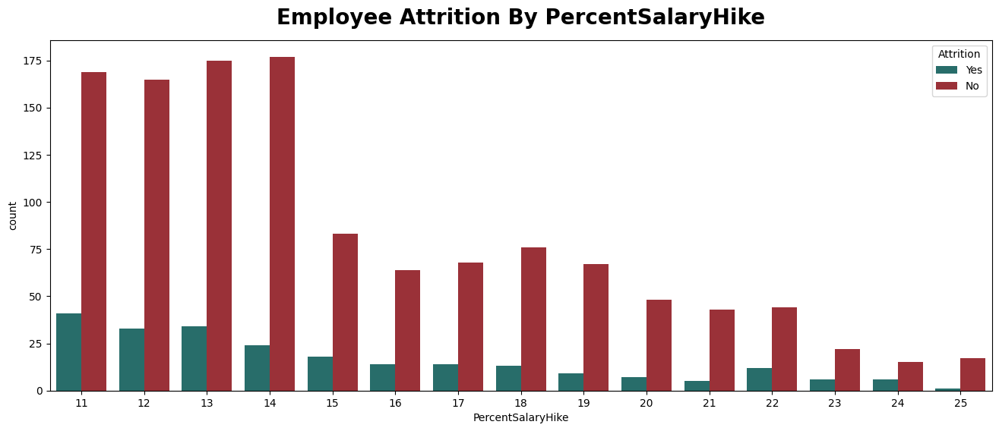

In [33]:
#Visualization to show Employee Distribution by Percentage Salary Hike.
plt.figure(figsize=(16,6))
sns.countplot(x="PercentSalaryHike", hue="Attrition", data=df, palette=["#1d7874","#AC1F29"])
plt.title("Employee Attrition By PercentSalaryHike",fontweight="black",size=20,pad=15)
plt.show()

In [34]:
df['YearsSinceLastPromotion'].describe()

count    1470.000000
mean        2.187755
std         3.222430
min         0.000000
25%         0.000000
50%         1.000000
75%         3.000000
max        15.000000
Name: YearsSinceLastPromotion, dtype: float64

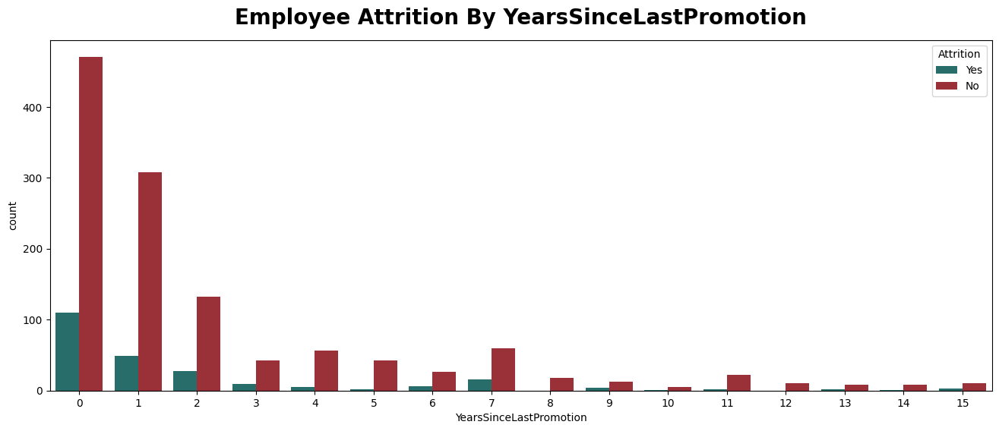

In [35]:
#Visualization to show Employee Distribution by Years Since Last Promotion .
plt.figure(figsize=(16,6))
sns.countplot(x="YearsSinceLastPromotion", hue="Attrition", data=df, palette=["#1d7874","#AC1F29"])
plt.title("Employee Attrition By YearsSinceLastPromotion",fontweight="black",size=20,pad=15)
plt.show()

Text(0.5, 1.0, 'Employee Attrition by YearsWithCurrManager feature')

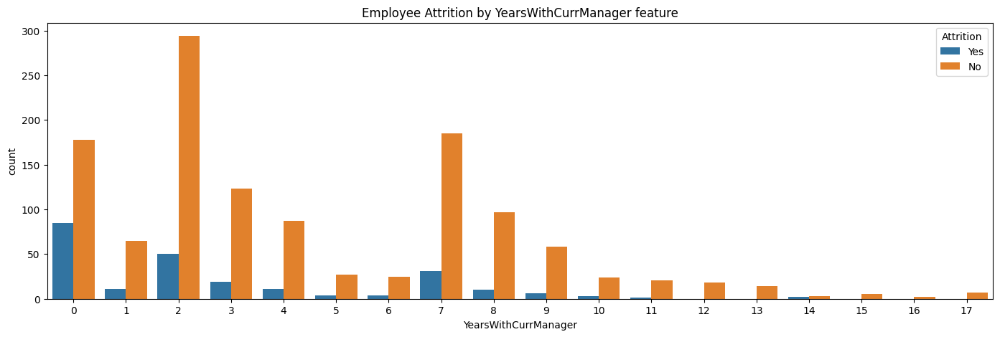

In [36]:
plt.figure(figsize=(17,5))
sns.countplot(x='YearsWithCurrManager',hue='Attrition',data=df)
plt.title("Employee Attrition by YearsWithCurrManager feature")

In [37]:
df['DistanceFromHome'].describe()

count    1470.000000
mean        9.192517
std         8.106864
min         1.000000
25%         2.000000
50%         7.000000
75%        14.000000
max        29.000000
Name: DistanceFromHome, dtype: float64

<Axes: ylabel='DistanceFromHome'>

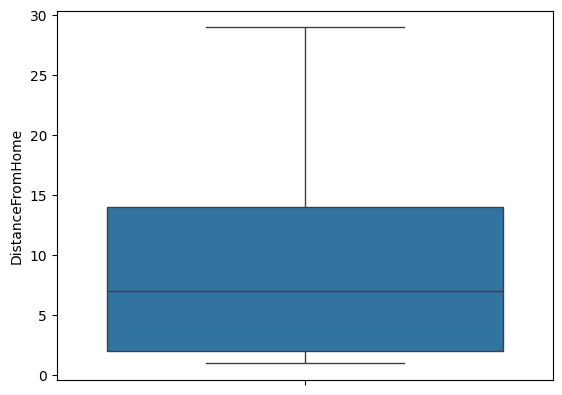

In [38]:
sns.boxplot(df['DistanceFromHome'])

C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\3024042908.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['DistanceFromHome'])


<Axes: xlabel='DistanceFromHome', ylabel='Density'>

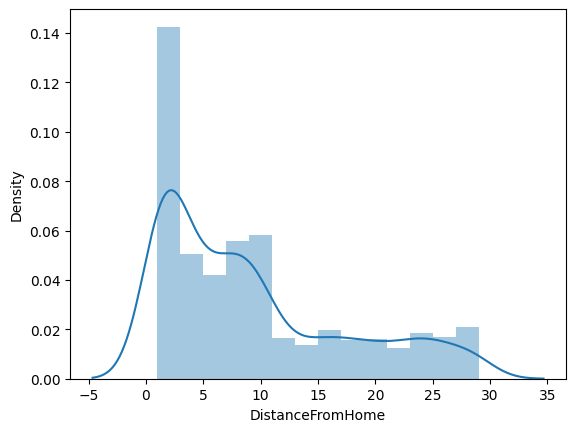

In [39]:
sns.distplot(df['DistanceFromHome'])

**since it has less unique values so we can transform it into categorical data.**

In [40]:
bin_edges=[0,2,5,10,30]
bin_labels=['0-2kms','2-5kms','5-10kms','10+kms']
df['DistanceGroups']=pd.cut(df['DistanceFromHome'],bins=bin_edges,labels=bin_labels,right=True)

In [41]:
df['DistanceGroups']

0        0-2kms
1       5-10kms
2        0-2kms
3        2-5kms
4        0-2kms
         ...   
1465     10+kms
1466    5-10kms
1467     2-5kms
1468     0-2kms
1469    5-10kms
Name: DistanceGroups, Length: 1470, dtype: category
Categories (4, object): ['0-2kms' < '2-5kms' < '5-10kms' < '10+kms']

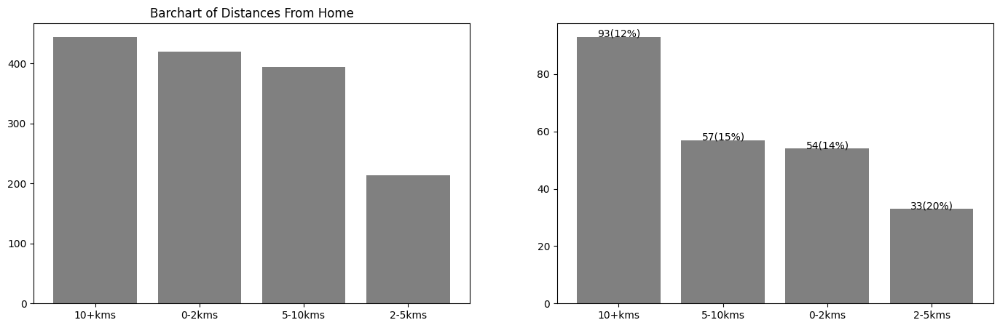

In [42]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
distances=df['DistanceGroups'].value_counts()
plt.bar(distances.index,height=distances.values,color='gray')
plt.title('Barchart of Distances From Home')

plt.subplot(1,2,2)
distances_Y=df[df['Attrition']=='Yes']['DistanceGroups'].value_counts()
attrition_rate=np.floor((distances_Y/distances)*100).values
plt.bar(distances_Y.index,height=distances_Y.values,color='gray')
for i,v in enumerate(distances_Y):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')

In [43]:
df['HourlyRate'].describe()

count    1470.000000
mean       65.891156
std        20.329428
min        30.000000
25%        48.000000
50%        66.000000
75%        83.750000
max       100.000000
Name: HourlyRate, dtype: float64

In [44]:
bin_edges=[0,45,66,84,100]
bin_labels=['0-45Hourlyrate','46-66Hourlyrate','67-84HourlyRate','85-100HourlyRate']
df['HourlyRateGroups']=pd.cut(df['HourlyRate'],bins=bin_edges,labels=bin_labels,right=True)

Text(0.5, 1.0, 'HourlyRateGroups wise attrition')

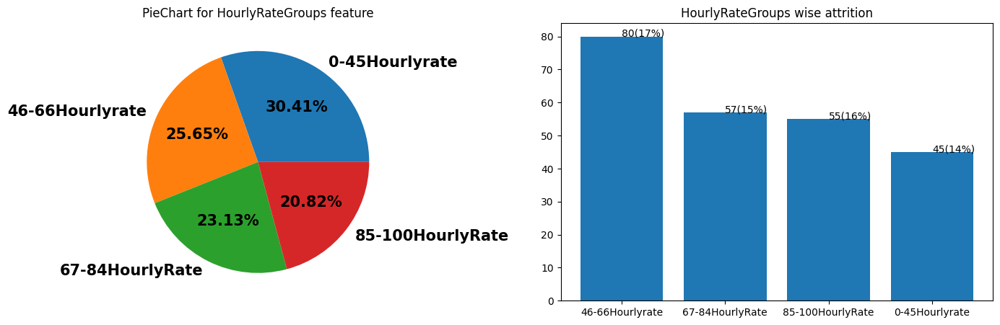

In [45]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['HourlyRateGroups'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=bin_labels,textprops={'fontweight':'black','size':15})
plt.title('PieChart for HourlyRateGroups feature')

plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['HourlyRateGroups'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(val2.index,val2.values)
for i, v in enumerate(val2):
    plt.text(i,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('HourlyRateGroups wise attrition')

In [46]:
df['HourlyRateGroups']

0       85-100HourlyRate
1        46-66Hourlyrate
2       85-100HourlyRate
3        46-66Hourlyrate
4         0-45Hourlyrate
              ...       
1465      0-45Hourlyrate
1466      0-45Hourlyrate
1467    85-100HourlyRate
1468     46-66Hourlyrate
1469     67-84HourlyRate
Name: HourlyRateGroups, Length: 1470, dtype: category
Categories (4, object): ['0-45Hourlyrate' < '46-66Hourlyrate' < '67-84HourlyRate' < '85-100HourlyRate']

In [47]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCompany                37
YearsInCur

In [48]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCompany                37
YearsInCur

In [49]:
#YearsAtCompany
df['YearsAtCompany'].describe()

count    1470.000000
mean        7.008163
std         6.126525
min         0.000000
25%         3.000000
50%         5.000000
75%         9.000000
max        40.000000
Name: YearsAtCompany, dtype: float64

In [50]:
bin_edges=[-1,3,5,9,40]
bin_labels=['0-3years','4-5years','6-9years','morethen 9']
df['YearsAtCompanygroups']=pd.cut(df['YearsAtCompany'],bins=bin_edges,labels=bin_labels,right=True)

In [51]:
df['YearsAtCompanygroups']

0         6-9years
1       morethen 9
2         0-3years
3         6-9years
4         0-3years
           ...    
1465      4-5years
1466      6-9years
1467      6-9years
1468      6-9years
1469      4-5years
Name: YearsAtCompanygroups, Length: 1470, dtype: category
Categories (4, object): ['0-3years' < '4-5years' < '6-9years' < 'morethen 9']

Text(0.5, 1.0, 'YearsAtCompany wise attrition')

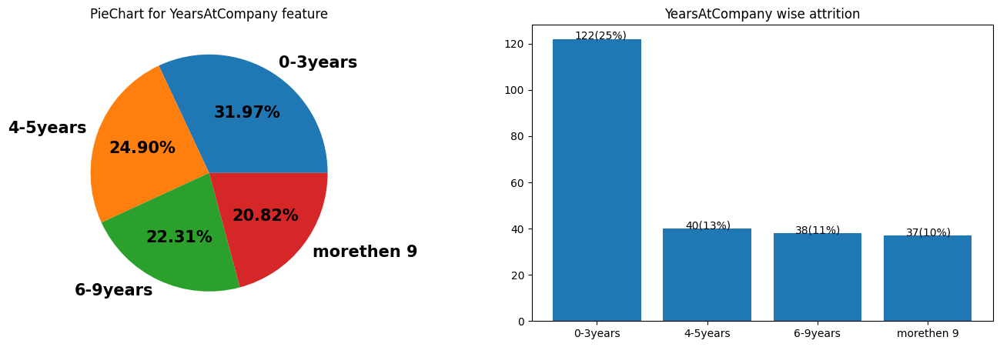

In [52]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['YearsAtCompanygroups'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=bin_labels,textprops={'fontweight':'black','size':15})
plt.title('PieChart for YearsAtCompany feature')
plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['YearsAtCompanygroups'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(bin_labels,val2.values)
for i, v in enumerate(val2):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('YearsAtCompany wise attrition')

In [53]:
df['YearsInCurrentRole'].describe()

count    1470.000000
mean        4.229252
std         3.623137
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        18.000000
Name: YearsInCurrentRole, dtype: float64

In [54]:
bin_edges=[-1,2,3,7,18]
bin_labels=['0-2years','3years','4-7years','8-18years']
df['YearsInCurrentRolegroups']=pd.cut(df['YearsInCurrentRole'],bins=bin_edges,labels=bin_labels,right=True)

Text(0.5, 1.0, 'YearsInCurrentRole wise attrition')

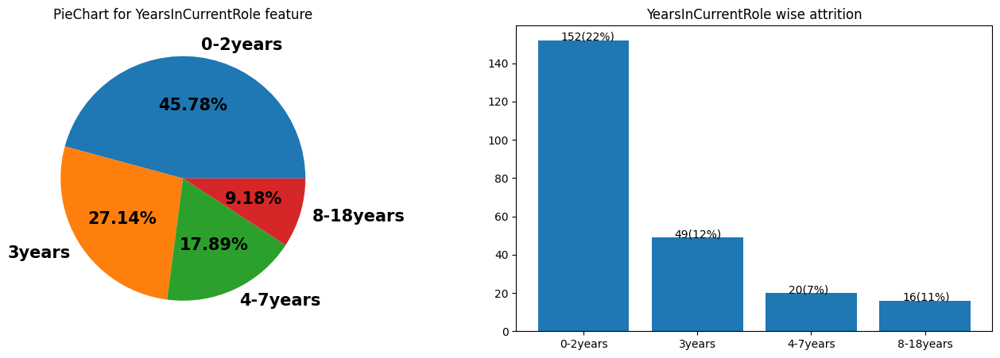

In [55]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['YearsInCurrentRolegroups'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=bin_labels,textprops={'fontweight':'black','size':15})
plt.title('PieChart for YearsInCurrentRole feature')
plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['YearsInCurrentRolegroups'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(bin_labels,val2.values)
for i, v in enumerate(val2):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('YearsInCurrentRole wise attrition')

C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\239728207.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['DailyRate'])


<Axes: xlabel='DailyRate', ylabel='Density'>

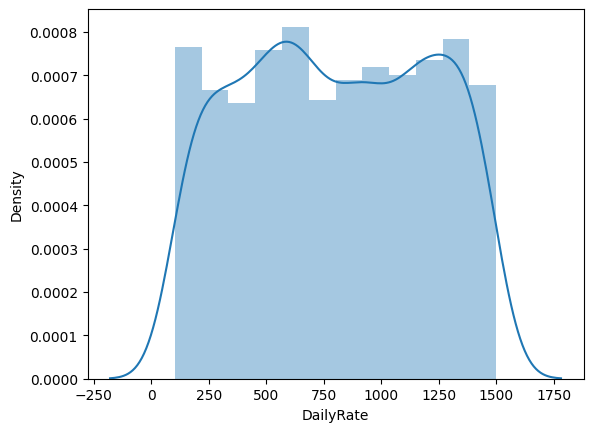

In [56]:
#DailyRate
sns.distplot(df['DailyRate'])

<Axes: ylabel='DailyRate'>

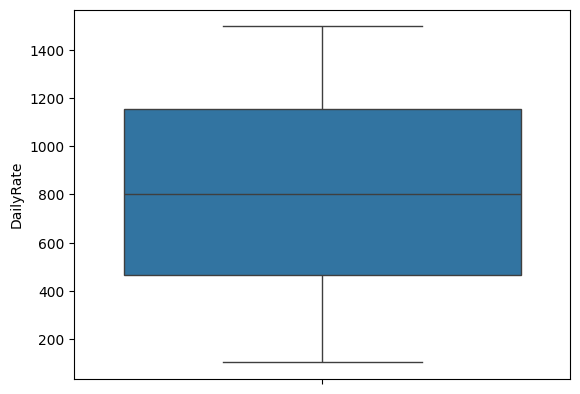

In [57]:
sns.boxplot(df['DailyRate'])

In [58]:
df['DailyRate'].describe()

count    1470.000000
mean      802.485714
std       403.509100
min       102.000000
25%       465.000000
50%       802.000000
75%      1157.000000
max      1499.000000
Name: DailyRate, dtype: float64

<BarContainer object of 1470 artists>

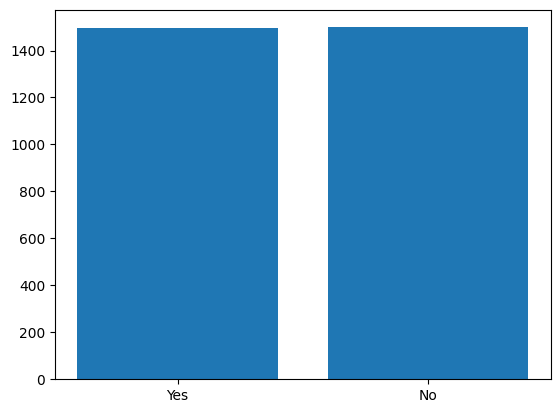

In [59]:
plt.bar(df['Attrition'],df['DailyRate'])

<Axes: xlabel='Attrition', ylabel='DailyRate'>

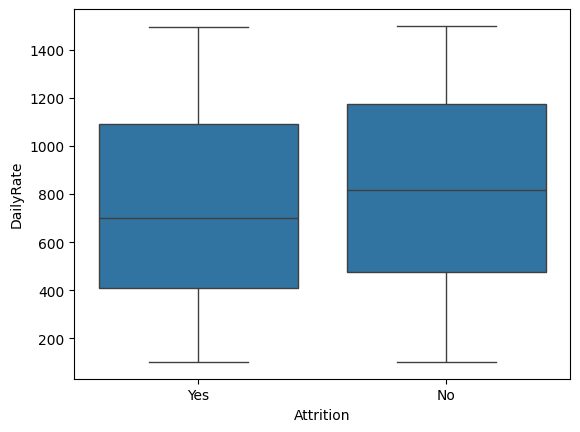

In [60]:
sns.boxplot(x=df['Attrition'],y=df['DailyRate'])

0.23415286942282074


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\3093276168.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Attrition']=='Yes']['DailyRate'])


<Axes: xlabel='DailyRate', ylabel='Density'>

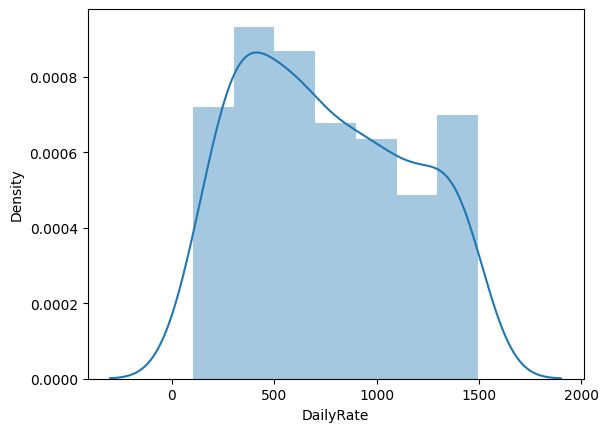

In [61]:
print(df[df['Attrition']=='Yes']['DailyRate'].skew())
sns.distplot(df[df['Attrition']=='Yes']['DailyRate'])

0.23415286942282074


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\3688364761.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Attrition']=='No']['DailyRate'])


<Axes: xlabel='DailyRate', ylabel='Density'>

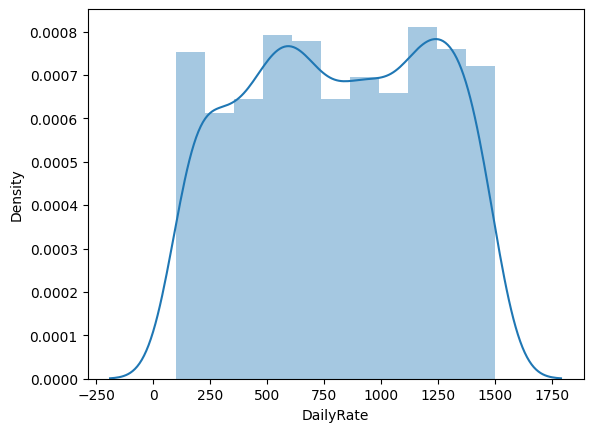

In [62]:
print(df[df['Attrition']=='Yes']['DailyRate'].skew())
sns.distplot(df[df['Attrition']=='No']['DailyRate'])

1.3698166808390662


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\999159367.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['MonthlyIncome'])


<Axes: xlabel='MonthlyIncome', ylabel='Density'>

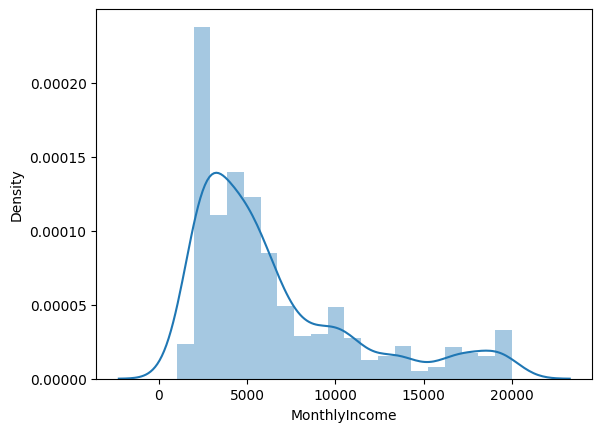

In [63]:
#MonthlyIncome
print(df['MonthlyIncome'].skew())
sns.distplot(df['MonthlyIncome'])

# Write skewed so we have to power transformation.

1.3698166808390662


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\2804265772.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Attrition']=='Yes']['MonthlyIncome'])


<Axes: xlabel='MonthlyIncome', ylabel='Density'>

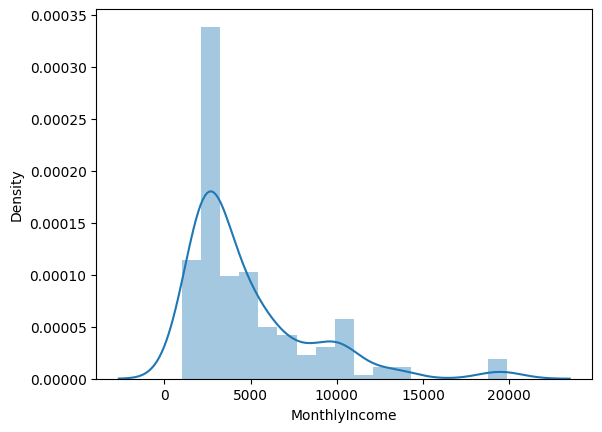

In [64]:
print(df['MonthlyIncome'].skew())
sns.distplot(df[df['Attrition']=='Yes']['MonthlyIncome'])

1.3698166808390662


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\3725513604.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Attrition']=='No']['MonthlyIncome'])


<Axes: xlabel='MonthlyIncome', ylabel='Density'>

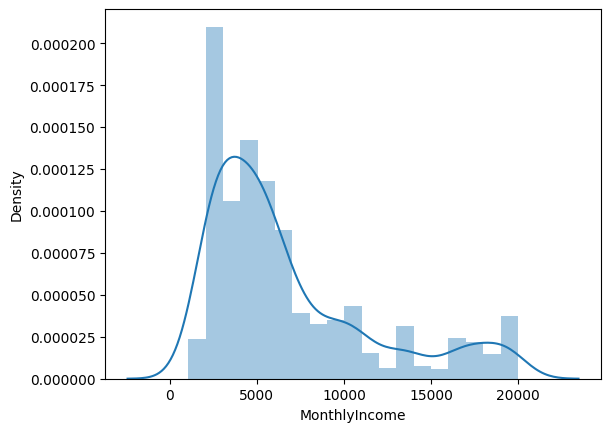

In [65]:
print(df['MonthlyIncome'].skew())
sns.distplot(df[df['Attrition']=='No']['MonthlyIncome'])

<Axes: xlabel='Attrition', ylabel='MonthlyRate'>

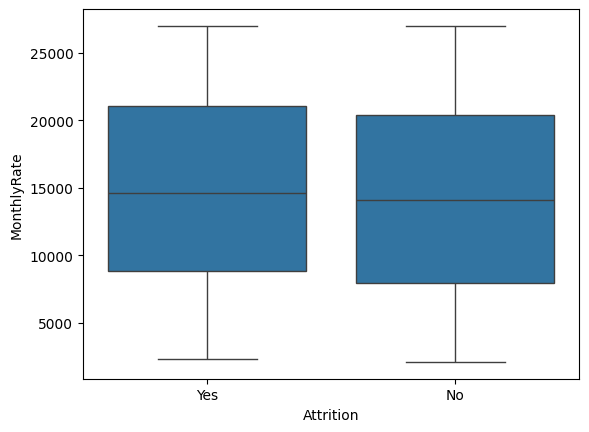

In [66]:
sns.boxplot(x=df['Attrition'],y=df['MonthlyRate'])

# MonthlyRate

In [67]:
df['MonthlyRate'].describe()

count     1470.000000
mean     14313.103401
std       7117.786044
min       2094.000000
25%       8047.000000
50%      14235.500000
75%      20461.500000
max      26999.000000
Name: MonthlyRate, dtype: float64

0.018577807891132458


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\1795084511.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Attrition']=='No']['MonthlyRate'])


<Axes: xlabel='MonthlyRate', ylabel='Density'>

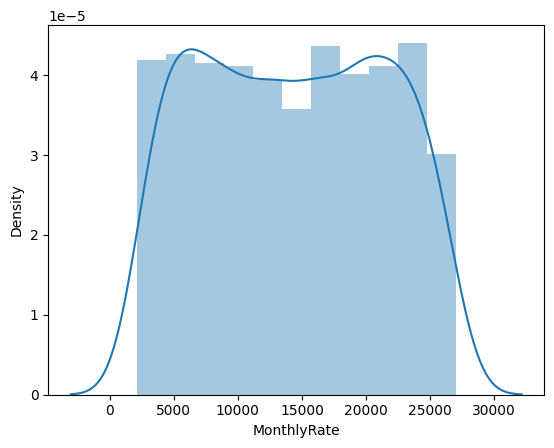

In [68]:
print(df['MonthlyRate'].skew())
sns.distplot(df[df['Attrition']=='No']['MonthlyRate'])

0.018577807891132458


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\2952050249.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Attrition']=='Yes']['MonthlyRate'])


<Axes: xlabel='MonthlyRate', ylabel='Density'>

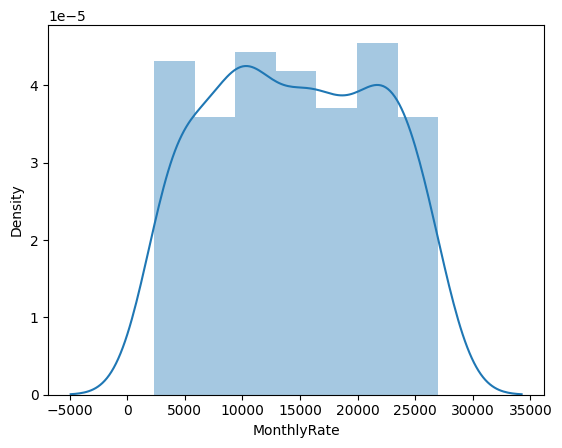

In [69]:
print(df['MonthlyRate'].skew())
sns.distplot(df[df['Attrition']=='Yes']['MonthlyRate'])

0.018577807891132458


C:\Users\prashu\AppData\Local\Temp\ipykernel_13212\3774337802.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['MonthlyRate'])


<Axes: xlabel='MonthlyRate', ylabel='Density'>

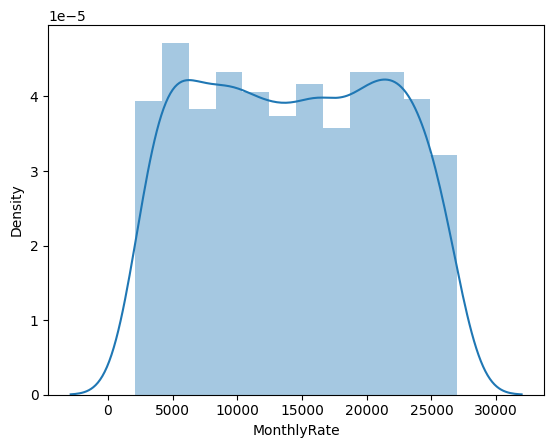

In [70]:
print(df['MonthlyRate'].skew())
sns.distplot(df['MonthlyRate'])

In [71]:
import plotly.express as px

In [72]:
px.scatter_3d(x=df['DailyRate'],y=df['MonthlyRate'],z=df['MonthlyIncome'],color=df['Attrition'])

In [73]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'DistanceGroups', 'HourlyRateGroups', 'YearsAtCompanygroups',
       'YearsInCurrentRolegroups'],
      dtype='object')

In [74]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCompany                37
YearsInCur

# TotalWorkingYears

In [75]:
df['TotalWorkingYears'].nunique()

40

In [76]:
df['TotalWorkingYears'].describe()

count    1470.000000
mean       11.279592
std         7.780782
min         0.000000
25%         6.000000
50%        10.000000
75%        15.000000
max        40.000000
Name: TotalWorkingYears, dtype: float64

In [77]:
bin_edges=[-1,6,10,15,40]
bin_labels=['lessthan-6years','6-10years','10-15years','morethan-15years']
df['TotalWorkingYearsgroups']=pd.cut(df['TotalWorkingYears'],bins=bin_edges,labels=bin_labels,right=True)

Text(0.5, 1.0, 'TotalWorkingYearsgroups wise attrition')

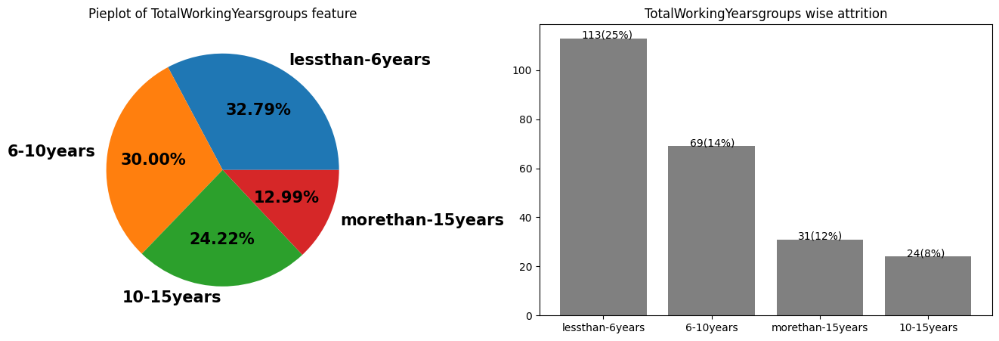

In [78]:
plt.figure(figsize=(17,5))
plt.subplot(1,2,1)
val1=df['TotalWorkingYearsgroups'].value_counts()
plt.pie(val1,autopct='%.2f%%',labels=bin_labels,textprops={'fontweight':'black','size':15})
plt.title('Pieplot of TotalWorkingYearsgroups feature')

plt.subplot(1,2,2)
val2=df[df['Attrition']=='Yes']['TotalWorkingYearsgroups'].value_counts()
attrition_rate=np.floor((val2/val1)*100).values
plt.bar(val2.index,val2.values,color='gray')
for i,v in enumerate(val2):
    plt.text(i-.2,v,str(v)+'('+str(int(attrition_rate[i]))+'%)')
plt.title('TotalWorkingYearsgroups wise attrition')

# Seperating the Data to train the models

**1]Training Models with original features**

# Random Forest Classifier

The Random Forest Classifier is a popular machine learning algorithm used for classification tasks. It belongs to the ensemble learning family, where it combines the predictions of multiple decision trees to make more accurate and robust classifications.

In [79]:
x1=df.drop(['Attrition','DistanceGroups','HourlyRateGroups','YearsAtCompanygroups','YearsInCurrentRolegroups','TotalWorkingYearsgroups'],axis=1)
y1=df['Attrition']
x1.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [81]:
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,PowerTransformer,StandardScaler,LabelEncoder
y1=LabelEncoder().fit_transform(y1)
y1

array([1, 0, 1, ..., 0, 0, 0], shape=(1470,))

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
x_train1,x_test1,y_train1,y_test1=train_test_split(x1,y1,test_size=.25,random_state=42)
trf1=ColumnTransformer(
    [('OrdinalEncoder',OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),[9,13,15,16,19]),
     ('ohe',OneHotEncoder(drop='first',sparse_output=False),[1,3,6,14])]
    ,remainder='passthrough')

In [83]:
trf2=ColumnTransformer(
    [('powertransformer',PowerTransformer(),[17])]
     ,remainder='passthrough')

In [84]:
trf3=ColumnTransformer(
    [('scalling',StandardScaler(),[18,2])]
    ,remainder='passthrough')

In [85]:
from sklearn.ensemble import RandomForestClassifier
trf4=RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=10,random_state=44)

In [86]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
model1=ImbPipeline(steps=[
    ('trf1',trf1),
    ('trf3',trf3),
    ('trf2',trf2),
    ('smote', SMOTE(random_state=42)),  # SMOTE step
    ('classifier', trf4)])# Classifier step

In [87]:
model1.fit(x_train1,y_train1)

Pipeline(steps=[('trf1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('OrdinalEncoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  [9, 13, 15, 16, 19]),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  [1, 3, 6, 14])])),
                ('trf3',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('scalling', StandardScaler(),
                                                  [18, 2])])),
                ('trf2',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('powertransformer',
                                                  PowerTransformer(), [17])])),
                ('smote', SMOTE(random_state=42)),
                ('classifier',
                 RandomForestClassifier(max_depth=10, random_state=44))])

In [88]:
y_pred=model1.predict(x_test1)

In [89]:
from sklearn.metrics import accuracy_score,classification_report
print('accuracy: ',accuracy_score(y_test1,y_pred) )
ClassificationReport = classification_report(y_test1,y_pred)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.8695652173913043
Classification Report is :
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       320
           1       0.50      0.23      0.31        48

    accuracy                           0.87       368
   macro avg       0.70      0.60      0.62       368
weighted avg       0.84      0.87      0.85       368



In [91]:
from sklearn.model_selection import cross_val_score
np.mean(cross_val_score(model1,x1,y1,cv=10,scoring='accuracy'))

np.float64(0.8673469387755102)

**2]Training Models with updated features**

# RandomForestClassifier

In [92]:
x=df.drop(['DistanceFromHome','HourlyRate','YearsAtCompany','YearsInCurrentRole','TotalWorkingYears','Attrition'],axis=1)
y=df['Attrition']

In [93]:
x.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'Education',
       'EducationField', 'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'DistanceGroups', 'HourlyRateGroups',
       'YearsAtCompanygroups', 'YearsInCurrentRolegroups',
       'TotalWorkingYearsgroups'],
      dtype='object')

In [94]:
x.describe(include='O')

,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
count,1470,1470,1470,1470,1470,1470,1470
unique,3,3,6,2,9,3,2
top,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,No
freq,1043,961,606,882,326,673,1054


In [95]:
y=LabelEncoder().fit_transform(y)

In [96]:
x.shape

(1470, 32)

In [97]:
trf21=ColumnTransformer(
    [('OrdinalEncoder',OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),[8,13,17,27,28,29,30,31]),
     ('ohe',OneHotEncoder(drop='first',sparse_output=False),[1,3,5,11])]
    ,remainder='passthrough')

In [98]:
trf22=ColumnTransformer(
    [('powertransformer',PowerTransformer(),[14])]
     ,remainder='passthrough')

In [99]:
trf23=ColumnTransformer(
    [('scalling',StandardScaler(),[15,2])]
    ,remainder='passthrough')

In [100]:
trf24=RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=10,random_state=44)

In [103]:
from sklearn.pipeline import Pipeline
pipe=Pipeline([
    ('trf1',trf21),
    ('trf2',trf22),
    ('trf3',trf23)])

In [104]:
x_trf=pipe.fit_transform(x)
x_trf.shape

(1470, 45)

In [105]:
smote=SMOTE(k_neighbors=5,random_state=42)
x_res,y_res=smote.fit_resample(x_trf,y)
x_res.shape

(2466, 45)

In [106]:
x_train,x_test,y_train,y_test=train_test_split(x_res,y_res,test_size=.25,random_state=42)

In [107]:
model2=RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=10,random_state=44)
model2.fit(x_train,y_train)

RandomForestClassifier(max_depth=10, random_state=44)

In [108]:
y_pred2=model2.predict(x_test)

In [109]:
print('accuracy: ',accuracy_score(y_test,y_pred2) )
ClassificationReport = classification_report(y_test,y_pred2)
print('Classification Report is :')
print(ClassificationReport)
print(np.mean(cross_val_score(model2,x_res,y_res,cv=10,scoring='accuracy')))

accuracy:  0.9222042139384117
Classification Report is :
              precision    recall  f1-score   support

           0       0.88      0.98      0.93       311
           1       0.98      0.86      0.92       306

    accuracy                           0.92       617
   macro avg       0.93      0.92      0.92       617
weighted avg       0.93      0.92      0.92       617

0.9210279450972647


# LogisticRegression

Logistic Regression is a widely used statistical method and machine learning algorithm for binary and multi-class classification tasks. It is particularly useful when you want to model the probability of a binary outcome (0 or 1) based on one or more predictor variables.

In [111]:
from sklearn.linear_model import LogisticRegression
model3=LogisticRegression(max_iter=100,penalty='l2',solver='sag',C=2.0,random_state=44)
model3.fit(x_train,y_train)

C:\Users\prashu\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



LogisticRegression(C=2.0, random_state=44, solver='sag')

In [112]:
y_pred3=model3.predict(x_test)

In [113]:
print('accuracy: ',accuracy_score(y_test,y_pred3) )
ClassificationReport = classification_report(y_test,y_pred3)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.5753646677471637
Classification Report is :
              precision    recall  f1-score   support

           0       0.59      0.54      0.56       311
           1       0.57      0.61      0.59       306

    accuracy                           0.58       617
   macro avg       0.58      0.58      0.57       617
weighted avg       0.58      0.58      0.57       617



# Stochastic Gradient Descent (SGD) Classifier

The Stochastic Gradient Descent (SGD) Classifier is a machine learning algorithm used for both binary and multiclass classification. It's a variant of gradient descent that updates model parameters based on a small, randomly selected subset of training data at each iteration.

In [114]:
from sklearn.linear_model import SGDClassifier

In [115]:
model4=SGDClassifier(penalty='l2',learning_rate='optimal',random_state=44)
model4.fit(x_train,y_train)

SGDClassifier(random_state=44)

In [116]:
y_pred4=model4.predict(x_test)

In [117]:
from sklearn.metrics import accuracy_score,classification_report
print('accuracy: ',accuracy_score(y_test,y_pred4) )
ClassificationReport = classification_report(y_test,y_pred4)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.4991896272285251
Classification Report is :
              precision    recall  f1-score   support

           0       0.67      0.01      0.03       311
           1       0.50      0.99      0.66       306

    accuracy                           0.50       617
   macro avg       0.58      0.50      0.34       617
weighted avg       0.58      0.50      0.34       617



# Support Vector Classifier (SVC)

Support Vector Machines (SVM) is a powerful supervised machine learning algorithm used for classification and regression tasks. The Support Vector Classifier (SVC) is an SVM variant specifically designed for classification tasks.

In [118]:
from sklearn.svm import SVC

In [119]:
model5= SVC(kernel= 'rbf',max_iter=500,C=2.0,gamma='auto')
model5.fit(x_train,y_train)

C:\Users\prashu\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning:

Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.



SVC(C=2.0, gamma='auto', max_iter=500)

In [120]:
y_pred5=model5.predict(x_test)

In [121]:
from sklearn.metrics import accuracy_score,classification_report
print('accuracy: ',accuracy_score(y_test,y_pred5) )
ClassificationReport = classification_report(y_test,y_pred5,zero_division=0)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.5542949756888168
Classification Report is :
              precision    recall  f1-score   support

           0       0.53      1.00      0.69       311
           1       1.00      0.10      0.18       306

    accuracy                           0.55       617
   macro avg       0.77      0.55      0.44       617
weighted avg       0.76      0.55      0.44       617



# K-Nearest Neighbors (KNN)

K-Nearest Neighbors (KNN) is a simple but powerful supervised machine learning algorithm used for both classification and regression tasks. It's a type of instance-based learning where the algorithm makes predictions by finding the K-nearest data points in the training dataset to a given input, and then it makes predictions based on those nearest neighbors.

In [122]:
from sklearn.neighbors import KNeighborsClassifier

In [123]:
model6=KNeighborsClassifier(n_neighbors=9,weights ='uniform',algorithm='auto')
model6.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=9)

In [124]:
y_pred6=model6.predict(x_test)

In [125]:
from sklearn.metrics import accuracy_score,classification_report
print('accuracy: ',accuracy_score(y_test,y_pred6) )
ClassificationReport = classification_report(y_test,y_pred6,zero_division=0)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.7277147487844409
Classification Report is :
              precision    recall  f1-score   support

           0       0.82      0.59      0.69       311
           1       0.68      0.87      0.76       306

    accuracy                           0.73       617
   macro avg       0.75      0.73      0.72       617
weighted avg       0.75      0.73      0.72       617



In [126]:
from xgboost import XGBClassifier

In [127]:
model7=XGBClassifier(n_estimators=150, max_depth=5, learning_rate=0.01, objective='binary:logistic')
model7.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [128]:
y_pred7=model7.predict(x_test)

In [129]:
from sklearn.metrics import accuracy_score,classification_report
print('accuracy: ',accuracy_score(y_test,y_pred7) )
ClassificationReport = classification_report(y_test,y_pred7,zero_division=0)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.9011345218800648
Classification Report is :
              precision    recall  f1-score   support

           0       0.86      0.96      0.91       311
           1       0.95      0.84      0.89       306

    accuracy                           0.90       617
   macro avg       0.91      0.90      0.90       617
weighted avg       0.91      0.90      0.90       617



In [130]:
from sklearn.model_selection import cross_val_score
np.mean(cross_val_score(model7,x_res,y_res,cv=10,scoring='accuracy'))

np.float64(0.8861196142325797)

In [152]:
from sklearn.ensemble import StackingClassifier

In [153]:
base_esti=[('RF',RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=10,random_state=44))]
model8=StackingClassifier(estimators=base_esti,final_estimator=XGBClassifier(n_estimators=150, max_depth=5, learning_rate=0.01, objective='binary:logistic'))

In [154]:
model8.fit(x_train,y_train)

StackingClassifier(estimators=[('RF',
                                RandomForestClassifier(max_depth=10,
                                                       random_state=44))],
                   final_estimator=XGBClassifier(base_score=None, booster=None,
                                                 callbacks=None,
                                                 colsample_bylevel=None,
                                                 colsample_bynode=None,
                                                 colsample_bytree=None,
                                                 device=None,
                                                 early_stopping_rounds=None,
                                                 enable_categorical=False,
                                                 eval_metric=None,
                                                 feature_types=None, gamma=None,
                                                 grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=0.01,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=5, max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 multi_strategy=None,
                                                 n_estimators=150, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 random_state=None, ...))

In [155]:
y_pred8=model8.predict(x_test)

In [156]:
print('accuracy: ',accuracy_score(y_test,y_pred8) )
ClassificationReport = classification_report(y_test,y_pred8,zero_division=0)
print('Classification Report is :')
print(ClassificationReport)

accuracy:  0.9319286871961102
Classification Report is :
              precision    recall  f1-score   support

           0       0.89      0.98      0.94       311
           1       0.98      0.88      0.93       306

    accuracy                           0.93       617
   macro avg       0.94      0.93      0.93       617
weighted avg       0.94      0.93      0.93       617

